
Parsing 16ms_End2End for End-to-End matchups…
  -> Extracted 113820 raw packets for PLC -> IO
     [+] Auto-detected 512 tick increment at offset 42
     [+] Locked onto Cycle Counter at byte offset: 42
     [+] Successfully paired 56887 true end-to-end transits.
  -> Extracted 113828 raw packets for IO -> PLC
     [+] Auto-detected 512 tick increment at offset 42
     [+] Locked onto Cycle Counter at byte offset: 42
     [+] Successfully paired 56881 true end-to-end transits.

--- True E2E Latency: 16ms_End2End ---

Stream: IO -> PLC
  Matched packets      : 56881
  Mean E2E latency     : 0.775 ms
  E2E jitter (σ)       : 0.930 ms
  RFC 3550 jitter      : 0.221 ms
  Min / Max latency    : 0.527 / 35.694 ms
  P50 / P95 / P99      : 0.597 / 1.285 / 4.866 ms
  P99.9                : 12.995 ms
  FD bin width (raw)   : 0.001915 ms
  Zoom bin (capped)    : 0.0019 ms  [floor=0.001 ms]
  Full bin (capped)    : 0.0019 ms

Stream: PLC -> IO
  Matched packets      : 56887
  Mean E2E latency    

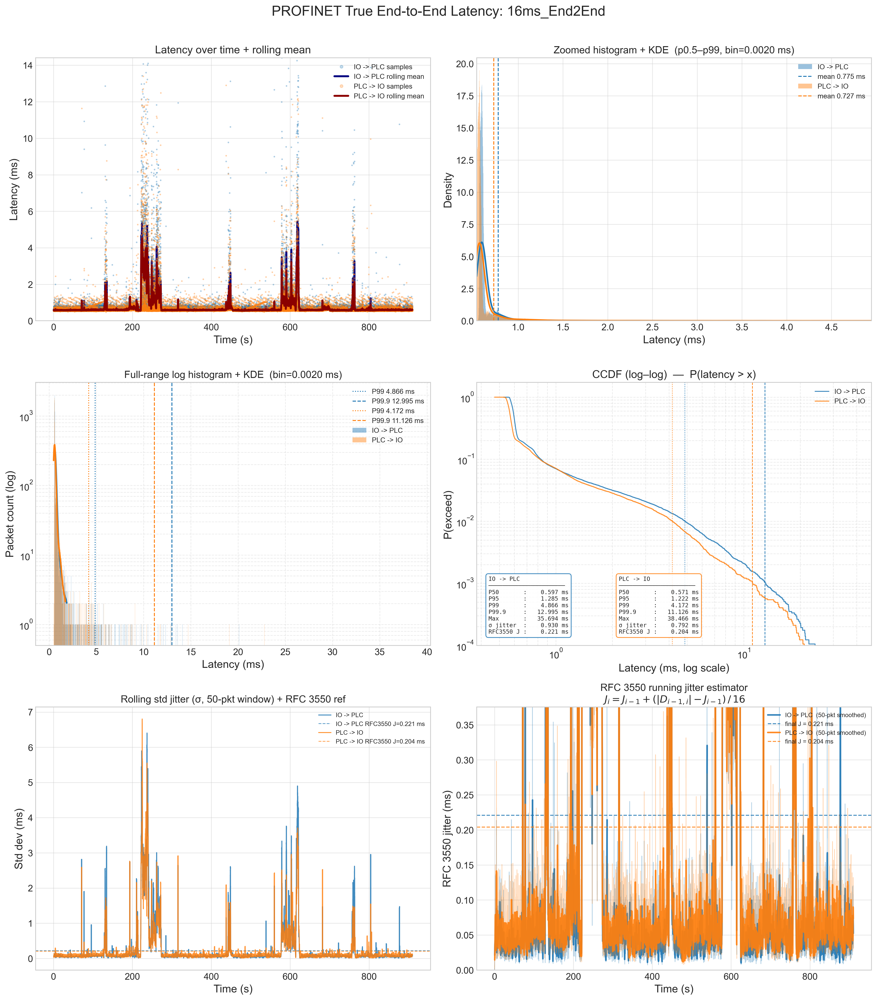


Parsing 32ms_End2End for End-to-End matchups…
  -> Extracted 56796 raw packets for PLC -> IO
     [+] Auto-detected 1024 tick increment at offset 42
     [+] Locked onto Cycle Counter at byte offset: 42
     [+] Successfully paired 28398 true end-to-end transits.
  -> Extracted 56800 raw packets for IO -> PLC
     [+] Auto-detected 1024 tick increment at offset 42
     [+] Locked onto Cycle Counter at byte offset: 42
     [+] Successfully paired 28400 true end-to-end transits.

--- True E2E Latency: 32ms_End2End ---

Stream: IO -> PLC
  Matched packets      : 28400
  Mean E2E latency     : 0.601 ms
  E2E jitter (σ)       : 0.028 ms
  RFC 3550 jitter      : 0.015 ms
  Min / Max latency    : 0.527 / 1.230 ms
  P50 / P95 / P99      : 0.601 / 0.623 / 0.736 ms
  P99.9                : 0.870 ms
  FD bin width (raw)   : 0.001357 ms
  Zoom bin (capped)    : 0.0014 ms  [floor=0.001 ms]
  Full bin (capped)    : 0.0014 ms

Stream: PLC -> IO
  Matched packets      : 28398
  Mean E2E latency     :

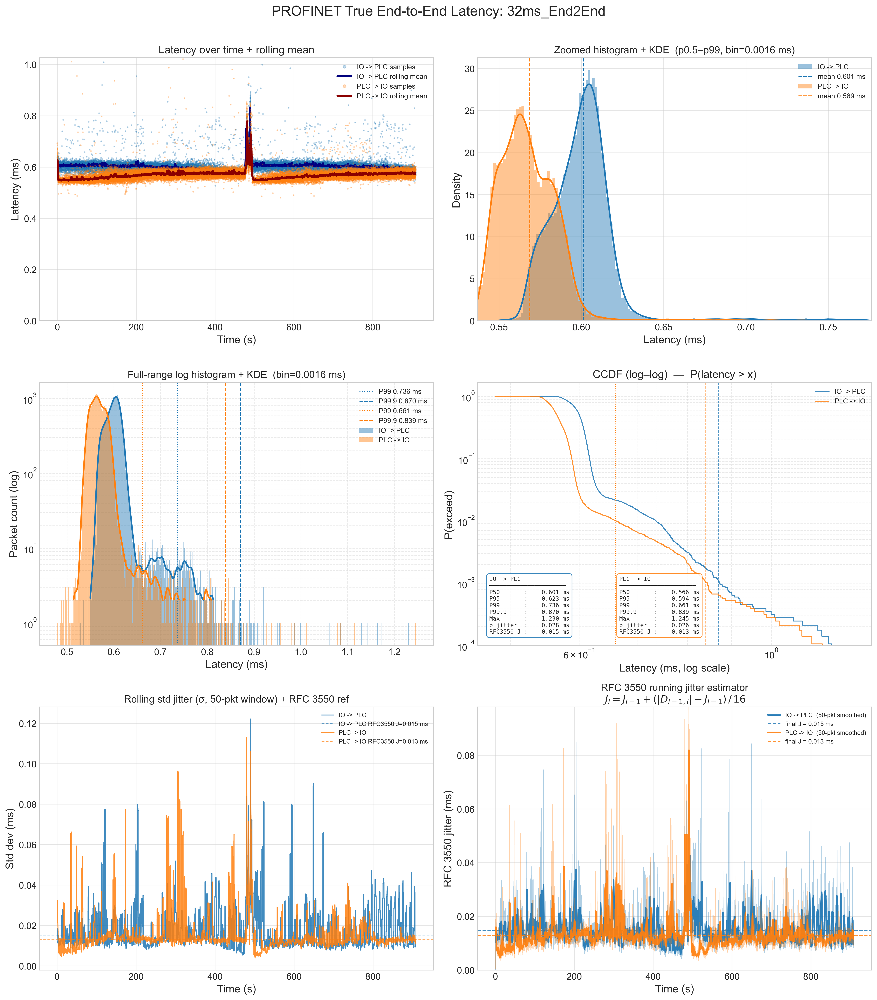


Parsing 64ms_End2End for End-to-End matchups…
  -> Extracted 28424 raw packets for PLC -> IO
     [+] Auto-detected 2048 tick increment at offset 42
     [+] Locked onto Cycle Counter at byte offset: 42
     [+] Successfully paired 14212 true end-to-end transits.
  -> Extracted 28426 raw packets for IO -> PLC
     [+] Auto-detected 2048 tick increment at offset 42
     [+] Locked onto Cycle Counter at byte offset: 42
     [+] Successfully paired 14213 true end-to-end transits.

--- True E2E Latency: 64ms_End2End ---

Stream: IO -> PLC
  Matched packets      : 14213
  Mean E2E latency     : 0.606 ms
  E2E jitter (σ)       : 0.027 ms
  RFC 3550 jitter      : 0.015 ms
  Min / Max latency    : 0.521 / 1.232 ms
  P50 / P95 / P99      : 0.606 / 0.626 / 0.712 ms
  P99.9                : 0.889 ms
  FD bin width (raw)   : 0.001634 ms
  Zoom bin (capped)    : 0.0016 ms  [floor=0.001 ms]
  Full bin (capped)    : 0.0016 ms

Stream: PLC -> IO
  Matched packets      : 14212
  Mean E2E latency     :

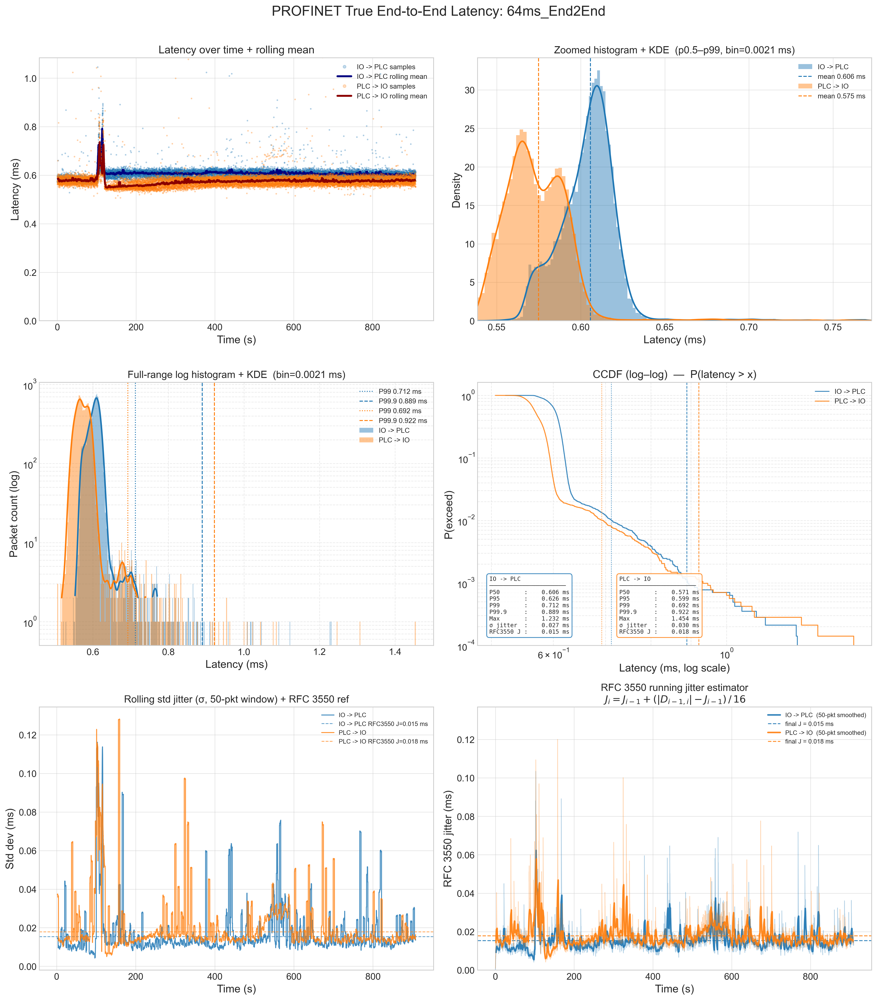


Parsing 128ms_End2End for End-to-End matchups…
  -> Extracted 14280 raw packets for PLC -> IO
     [+] Auto-detected 4096 tick increment at offset 42
     [+] Locked onto Cycle Counter at byte offset: 42
     [+] Successfully paired 7140 true end-to-end transits.
  -> Extracted 14280 raw packets for IO -> PLC
     [+] Auto-detected 4096 tick increment at offset 42
     [+] Locked onto Cycle Counter at byte offset: 42
     [+] Successfully paired 7140 true end-to-end transits.

--- True E2E Latency: 128ms_End2End ---

Stream: IO -> PLC
  Matched packets      : 7140
  Mean E2E latency     : 0.789 ms
  E2E jitter (σ)       : 1.011 ms
  RFC 3550 jitter      : 0.222 ms
  Min / Max latency    : 0.555 / 30.864 ms
  P50 / P95 / P99      : 0.620 / 1.305 / 4.555 ms
  P99.9                : 15.211 ms
  FD bin width (raw)   : 0.001871 ms
  Zoom bin (capped)    : 0.0019 ms  [floor=0.001 ms]
  Full bin (capped)    : 0.0019 ms

Stream: PLC -> IO
  Matched packets      : 7140
  Mean E2E latency     :

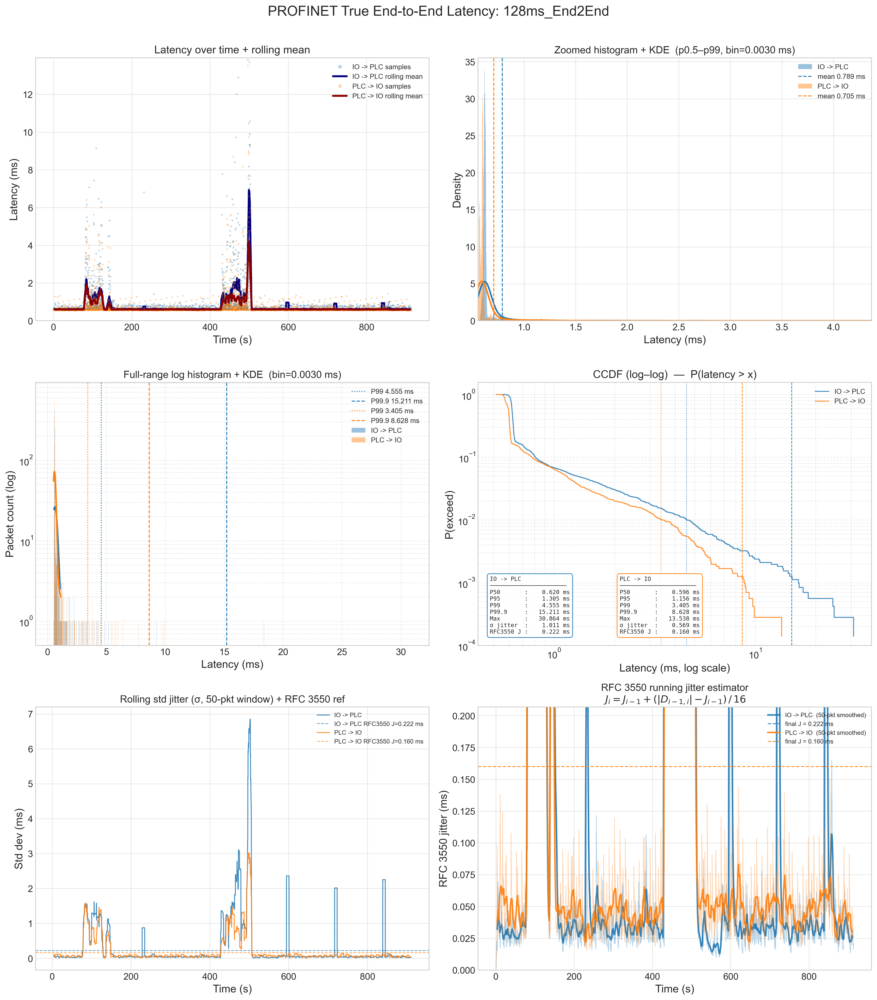

In [7]:
import os
import struct
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from decimal import Decimal, getcontext
from scipy.stats import gaussian_kde
import matplotlib.ticker as mticker
from scapy.all import PcapReader, Ether, Dot1Q, conf

# Absolute nanosecond precision
getcontext().prec = 20
conf.l2types.register(240, Ether)

# --- Configuration ---
MAC_PLC = "d6:87:75"
MAC_IO  = "d5:55:i0f"

MAC_PLC_BYTES = bytes.fromhex(MAC_PLC.replace(':', ''))
MAC_IO_BYTES  = bytes.fromhex(MAC_IO.replace(':', ''))
PROFINET_ETHERTYPE = 0x8892

FILES = {
    "16ms_End2End":  r"16ms/WLAN_16ms_Base_End2End.pcap",
    "32ms_End2End":  r"32ms/WLAN_32ms_Base_End2End.pcap",
    "64ms_End2End":  r"64ms/WLAN_64ms_Base_End2End.pcap",
    "128ms_End2End": r"128ms/WLAN_128ms_Base_End2End.pcap"
}

# Academic plotting style
plt.style.use('seaborn-v0_8-whitegrid')
plt.rcParams.update({
    'font.size': 12, 'axes.labelsize': 14, 'axes.titlesize': 15,
    'legend.fontsize': 10, 'figure.dpi': 300,
})

COLORS = ['#1f77b4', '#ff7f0e']
ROLLING_WINDOW = 50

# Minimum bin width — lower this if your latency spread is very tight.
# 0.001 ms = 1 µs resolution; set to 0.0005 for 500 ns resolution.
MIN_BIN_WIDTH_MS = 0.001


# ---------------------------------------------------------------------------
# Packet helpers
# ---------------------------------------------------------------------------

def extract_true_ethernet(raw_pkt):
    raw_bytes = bytes(raw_pkt)
    idx1 = raw_bytes.find(MAC_PLC_BYTES)
    idx2 = raw_bytes.find(MAC_IO_BYTES)
    if idx1 >= 0 and idx2 >= 0:
        eth_start = min(idx1, idx2) - 3
        if 0 <= eth_start < 24:
            return Ether(raw_bytes[eth_start:])
    if Ether in raw_pkt:
        return raw_pkt[Ether]
    return Ether(raw_bytes)


def find_cycle_counter_offset(packets):
    if not packets:
        return None
    min_len = min(len(p) for _t, p in packets)
    possible_steps = [512, 1024, 2048, 4096]
    valid_offsets = []

    for offset in range(min_len - 1):
        values = [struct.unpack('>H', p[offset:offset + 2])[0]
                  for _t, p in packets[:1000]]
        found_step = None
        is_valid = True
        for i in range(1, len(values)):
            diff = (values[i] - values[i - 1]) % 65536
            if diff != 0:
                if any(diff % step == 0 for step in possible_steps):
                    for s in possible_steps:
                        if diff % s == 0:
                            found_step = s
                else:
                    is_valid = False
                    break
        if is_valid and found_step is not None:
            valid_offsets.append((offset, found_step))

    if valid_offsets:
        best_offset, detected_step = max(valid_offsets, key=lambda x: x[0])
        print(f"     [+] Auto-detected {detected_step} tick increment at offset {best_offset}")
        return best_offset
    return None


# ---------------------------------------------------------------------------
# RFC 3550 jitter (§A.8)
# ---------------------------------------------------------------------------

def compute_rfc3550_jitter(latencies_ms):
    """
    RFC 3550 §A.8 interarrival jitter estimator applied to one-way delays.
    J(i) = J(i-1) + (|D(i-1, i)| - J(i-1)) / 16.0
    Returns (mean_J_ms, final_J_ms, running_series_ms).
    """
    if len(latencies_ms) < 2:
        return 0.0, 0.0, np.array([])
        
    lats = np.asarray(latencies_ms, dtype=float)
    J = 0.0
    running = []
    
    # Calculate EWMA jitter for each packet pair
    for i in range(1, len(lats)):
        d = abs(lats[i] - lats[i - 1])
        J += (d - J) / 16.0
        running.append(J)
        
    running_arr = np.array(running)
    
    # The mean of the running series represents the global RFC jitter for the whole trace
    mean_J = float(running_arr.mean()) if len(running_arr) > 0 else 0.0
    
    return mean_J, J, running_arr



# ---------------------------------------------------------------------------
# Main parsing / matching
# ---------------------------------------------------------------------------

def calculate_e2e_latency(file_path, label):
    print(f"\nParsing {label} for End-to-End matchups…")

    plc_to_io_packets = []
    io_to_plc_packets = []

    try:
        with PcapReader(file_path) as pcap:
            for raw_pkt in pcap:
                pkt = extract_true_ethernet(raw_pkt)
                if Ether not in pkt:
                    continue
                is_pn = (
                    pkt[Ether].type == PROFINET_ETHERTYPE
                    or (pkt.haslayer(Dot1Q) and pkt[Dot1Q].type == PROFINET_ETHERTYPE)
                )
                if not is_pn:
                    continue
                src = pkt[Ether].src
                dst = pkt[Ether].dst
                payload = (bytes(pkt[Dot1Q].payload)
                           if pkt.haslayer(Dot1Q)
                           else bytes(pkt[Ether].payload))
                exact_time = Decimal(str(raw_pkt.time))
                if src.endswith(MAC_PLC) and dst.endswith(MAC_IO):
                    plc_to_io_packets.append((exact_time, payload))
                elif src.endswith(MAC_IO) and dst.endswith(MAC_PLC):
                    io_to_plc_packets.append((exact_time, payload))
    except Exception as e:
        print(f"Error parsing: {e}")
        return pd.DataFrame()

    e2e_records = []

    def process_direction(packets, direction_name):
        nonlocal e2e_records
        if not packets:
            return
        packets.sort(key=lambda x: x[0])
        print(f"  -> Extracted {len(packets)} raw packets for {direction_name}")

        cc_offset = find_cycle_counter_offset(packets)
        if cc_offset is None:
            print(f"     [!] Could not locate a Cycle Counter for {direction_name}.")
            return
        print(f"     [+] Locked onto Cycle Counter at byte offset: {cc_offset}")

        grouped_cycles = {}
        last_cc = None
        unwrapped_id = 0
        for t, p in packets:
            cc = struct.unpack('>H', p[cc_offset:cc_offset + 2])[0]
            if last_cc is None:
                last_cc = cc
                unwrapped_id = cc
            diff = (cc - last_cc) % 65536
            if diff == 0:
                current_id = unwrapped_id
            elif diff < 32768:
                unwrapped_id += diff
                current_id = unwrapped_id
            else:
                current_id = unwrapped_id - (65536 - diff)
            last_cc = cc
            grouped_cycles.setdefault(current_id, []).append(t)

        matches = 0
        multi_match_count = 0
        CYCLE_TIME_MS = 64
        LOWER_THRESHOLD_SEC = Decimal('0.0001')
        UPPER_THRESHOLD_SEC = Decimal(str(CYCLE_TIME_MS * 3 / 1000))
        MS_CONVERSION = Decimal('1000')

        for unique_id, times in grouped_cycles.items():
            if len(times) == 2:
                dt_sec = times[1] - times[0]
                if LOWER_THRESHOLD_SEC < dt_sec < UPPER_THRESHOLD_SEC:
                    e2e_records.append({
                        'timestamp':      times[0],
                        'direction':      direction_name,
                        'e2e_latency_ms': dt_sec * MS_CONVERSION,
                    })
                    matches += 1
            elif len(times) > 2:
                multi_match_count += 1
                dt_sec = times[-1] - times[0]
                if LOWER_THRESHOLD_SEC < dt_sec < UPPER_THRESHOLD_SEC:
                    e2e_records.append({
                        'timestamp':      times[0],
                        'direction':      direction_name,
                        'e2e_latency_ms': dt_sec * MS_CONVERSION,
                    })
                    matches += 1

        print(f"     [+] Successfully paired {matches} true end-to-end transits.")
        if multi_match_count:
            print(f"     [!] {multi_match_count} cycles had >2 captures (possible retransmissions).")

    process_direction(plc_to_io_packets, "PLC -> IO")
    process_direction(io_to_plc_packets, "IO -> PLC")

    df = pd.DataFrame(e2e_records)
    if not df.empty:
        df = df.sort_values(by='timestamp').reset_index(drop=True)
        start_time = float(df['timestamp'].iloc[0])
        df['rel_time_s'] = [float(x) - start_time for x in df['timestamp']]
    return df


# ---------------------------------------------------------------------------
# Bin-width helper
# ---------------------------------------------------------------------------

def _fd_bin_width(data, zoom_cap=0.1, full_cap=0.5):
    """
    Compute Freedman-Diaconis bin widths with configurable caps.
    zoom_cap / full_cap in ms.  Floor = MIN_BIN_WIDTH_MS (global).
    """
    q25, q75 = np.percentile(data, [25, 75])
    iqr = q75 - q25
    n = len(data)
    fd = (2 * iqr / (n ** (1 / 3))) if (iqr > 0 and n > 0) else zoom_cap
    zoom_bw = max(MIN_BIN_WIDTH_MS, min(fd, zoom_cap))
    full_bw = max(MIN_BIN_WIDTH_MS, min(fd, full_cap))
    return fd, zoom_bw, full_bw


# ---------------------------------------------------------------------------
# Plotting
# ---------------------------------------------------------------------------

def plot_e2e(df, label):
    if df.empty:
        print("No matching end-to-end pairs found.")
        return

    print(f"\n{'=' * 40}")
    print(f"--- True E2E Latency: {label} ---")
    print(f"{'=' * 40}")

    fig, axes = plt.subplots(3, 2, figsize=(16, 18))
    axes = axes.flatten()
    # Extra top padding so suptitle never clips subplots
    fig.suptitle(f'PROFINET True End-to-End Latency: {label}',
                 fontsize=18, y=1.002)

    streams = list(df.groupby('direction'))

    # Pre-compute shared zoom x-limit across both streams (p1 to p99 + small pad)
    all_lats = df['e2e_latency_ms'].apply(float).values
    zoom_xmin = np.percentile(all_lats, 0.5)
    zoom_xmax = np.percentile(all_lats, 99) * 1.10   # 10 % pad, not +1.0 ms flat

    for (direction, valid_df), color in zip(streams, COLORS):
        if valid_df.empty:
            continue

        lats        = valid_df['e2e_latency_ms'].apply(float).values
        lats_sorted = np.sort(lats)
        n           = len(lats_sorted)

        mean_lat = lats.mean()
        max_lat  = lats.max()
        min_lat  = lats.min()
        std_lat  = lats.std(ddof=1)
        p50      = np.percentile(lats, 50)
        p95      = np.percentile(lats, 95)
        p99      = np.percentile(lats, 99)
        p999     = np.percentile(lats, 99.9)

        fd_width, zoom_bin_width, full_bin_width = _fd_bin_width(lats)
        mean_rfc_jitter, final_rfc_jitter, running_jitter_series = compute_rfc3550_jitter(lats)

        # ── Console ────────────────────────────────────────────────────────
        print(f"\nStream: {direction}")
        print(f"  Matched packets      : {n}")
        print(f"  Mean E2E latency     : {mean_lat:.3f} ms")
        print(f"  E2E jitter (σ)       : {std_lat:.3f} ms")
        print(f"  RFC 3550 jitter      : {mean_rfc_jitter:.3f} ms")
        print(f"  Min / Max latency    : {min_lat:.3f} / {max_lat:.3f} ms")
        print(f"  P50 / P95 / P99      : {p50:.3f} / {p95:.3f} / {p99:.3f} ms")
        print(f"  P99.9                : {p999:.3f} ms")
        print(f"  FD bin width (raw)   : {fd_width:.6f} ms")
        print(f"  Zoom bin (capped)    : {zoom_bin_width:.4f} ms  [floor={MIN_BIN_WIDTH_MS} ms]")
        print(f"  Full bin (capped)    : {full_bin_width:.4f} ms")

               # ── Plot 1 — time series + rolling mean ────────────────────────────
        # Clip y-axis to p99.9 so outliers don't squash the main cluster
        ts_ymax = np.percentile(lats, 99.9) * 1.15
        
        # Keep points semi-transparent with the original color
        axes[0].plot(valid_df['rel_time_s'], lats,
                     marker='.', linestyle='', markersize=2.5,
                     alpha=0.25, color=color, label=f'{direction} samples')
                     
        if n >= ROLLING_WINDOW:
            rolled_mean = (valid_df['e2e_latency_ms']
                           .apply(float)
                           .rolling(ROLLING_WINDOW, center=True)
                           .mean())
            
            # --- NEW: Assign a stark, contrasting color to the mean line ---
            line_color = 'navy' if color == COLORS[0] else 'darkred'
            
            axes[0].plot(valid_df['rel_time_s'], rolled_mean,
                         color=line_color, linewidth=2.5, alpha=1.0,
                         label=f'{direction} rolling mean')
                         
        axes[0].set_ylim(top=max(ts_ymax,
                                 axes[0].get_ylim()[1]
                                 if axes[0].get_ylim()[1] > 0 else ts_ymax))


        # ── Plot 2 — zoomed histogram + KDE ───────────────────────────────
        zoom_data = lats[(lats >= zoom_xmin) & (lats <= zoom_xmax)]
        if len(zoom_data) > 1:
            bins = np.arange(zoom_data.min(),
                             zoom_data.max() + zoom_bin_width,
                             zoom_bin_width)
            axes[1].hist(zoom_data, bins=bins, alpha=0.45,
                         color=color, density=True, label=direction)
            kde_zoom = gaussian_kde(zoom_data, bw_method='silverman')
            x_zoom   = np.linspace(zoom_xmin, zoom_xmax, 800)
            axes[1].plot(x_zoom, kde_zoom(x_zoom), color=color, linewidth=2.0)
            axes[1].axvline(mean_lat, color=color, linestyle='--', linewidth=1.2,
                            label=f'mean {mean_lat:.3f} ms')
        axes[1].set_xlim(zoom_xmin, zoom_xmax)

        # ── Plot 3 — full-range log histogram + masked KDE ────────────────
        full_bins = np.arange(0, max_lat + full_bin_width, full_bin_width)
        counts, edges = np.histogram(lats, bins=full_bins)
        counts_plot = counts.astype(float)
        counts_plot[counts_plot == 0] = np.nan
        axes[2].bar(edges[:-1], counts_plot, width=full_bin_width, align='edge',
                    alpha=0.45, color=color, label=direction)
        axes[2].set_yscale('log')

        kde_full   = gaussian_kde(lats, bw_method='silverman')
        x_full     = np.linspace(lats.min(), max_lat, 1000)
        kde_vals   = kde_full(x_full) * n * full_bin_width
        kde_masked = np.where(kde_vals >= 2.0, kde_vals, np.nan)
        axes[2].plot(x_full, kde_masked, color=color, linewidth=2.0)
        axes[2].axvline(p99,  color=color, linestyle=':',  linewidth=1.2,
                        label=f'P99 {p99:.3f} ms')
        axes[2].axvline(p999, color=color, linestyle='--', linewidth=1.2,
                        label=f'P99.9 {p999:.3f} ms')

        # ── Plot 4 — CCDF log-log + percentile annotation ─────────────────
        ccdf_y = np.arange(n, 0, -1) / n
        axes[3].step(lats_sorted, ccdf_y, where='post',
                     alpha=0.85, color=color, linewidth=1.2, label=direction)
        axes[3].axvline(p99,  color=color, linestyle=':',  linewidth=0.9)
        axes[3].axvline(p999, color=color, linestyle='--', linewidth=0.9)
        axes[3].set_xscale('log')
        axes[3].set_yscale('log')

        x_offset = 0.03 if color == COLORS[0] else 0.36
        table_text = (
            f"{direction}\n"
            f"{'─' * 22}\n"
            f"P50       : {p50:>8.3f} ms\n"
            f"P95       : {p95:>8.3f} ms\n"
            f"P99       : {p99:>8.3f} ms\n"
            f"P99.9     : {p999:>8.3f} ms\n"
            f"Max       : {max_lat:>8.3f} ms\n"
            f"σ jitter  : {std_lat:>8.3f} ms\n"
            f"RFC3550 J : {mean_rfc_jitter:>8.3f} ms"
        )
        axes[3].text(
            x_offset, 0.04, table_text,
            transform=axes[3].transAxes,
            fontsize=7.5, verticalalignment='bottom',
            fontfamily='monospace',
            bbox=dict(boxstyle='round,pad=0.45', facecolor='white',
                      edgecolor=color, alpha=0.88),
        )

        # ── Plot 5 — rolling std jitter + RFC 3550 reference line ──────────
        if n >= ROLLING_WINDOW:
            rolled_std = (valid_df['e2e_latency_ms']
                          .rolling(ROLLING_WINDOW, center=True)
                          .std(ddof=1))
            axes[4].plot(valid_df['rel_time_s'], rolled_std,
                         color=color, linewidth=1.2, alpha=0.85,
                         label=direction)
        # Dashed line: RFC 3550 final J for easy comparison
        axes[4].axhline(mean_rfc_jitter, color=color, linestyle='--',
                        linewidth=1.0, alpha=0.7,
                        label=f'{direction} RFC3550 J={mean_rfc_jitter:.3f} ms')

        # ── Plot 6 — RFC 3550 running estimator ───────────────────────────
        if len(running_jitter_series) > 0:
            rel_times = valid_df['rel_time_s'].values[1:len(running_jitter_series) + 1]
            # Smooth display with rolling mean of the running J series
            rfc_smooth = pd.Series(running_jitter_series).rolling(50, center=True).mean().values
            axes[5].plot(rel_times, running_jitter_series,
                         color=color, linewidth=0.8, alpha=0.35)          # raw (faint)
            axes[5].plot(rel_times, rfc_smooth,
                         color=color, linewidth=2.0, alpha=0.9,
                         label=f'{direction}  (50-pkt smoothed)')
            axes[5].axhline(mean_rfc_jitter, color=color, linestyle='--',
                            linewidth=1.2, alpha=0.85,
                            label=f'final J = {mean_rfc_jitter:.3f} ms')

    # ── Shared y-ceiling for time-series: don't let one stream dominate ───
    ymax_ts = np.percentile(all_lats, 99.9) * 1.20
    axes[0].set_ylim(bottom=0, top=ymax_ts)

    # ── RFC 3550 y-axis: clip to 3× the max final J value to suppress spikes
    all_rfc_finals = []
    for _dir, vdf in streams:
        lats_tmp = vdf['e2e_latency_ms'].apply(float).values
        _, jf, _ = compute_rfc3550_jitter(lats_tmp)
        all_rfc_finals.append(jf)
    rfc_ymax = max(all_rfc_finals) * 8 if all_rfc_finals else 1.0
    axes[5].set_ylim(bottom=0, top=rfc_ymax)

    # ── Axis labels & formatting ──────────────────────────────────────────
    axes[0].set_title('Latency over time + rolling mean', fontsize=14)
    axes[0].set_xlabel('Time (s)')
    axes[0].set_ylabel('Latency (ms)')
    axes[0].legend(fontsize=9, loc='upper right',
                   markerscale=3)   # larger dots in legend
    axes[0].grid(True, alpha=0.5)

    axes[1].set_title(
        f'Zoomed histogram + KDE  (p0.5–p99, bin={zoom_bin_width:.4f} ms)',
        fontsize=13)
    axes[1].set_xlabel('Latency (ms)')
    axes[1].set_ylabel('Density')
    axes[1].legend(fontsize=9, loc='upper right')
    axes[1].grid(True, alpha=0.5)
    axes[1].xaxis.set_minor_locator(mticker.AutoMinorLocator())

    axes[2].set_title(
        f'Full-range log histogram + KDE  (bin={full_bin_width:.4f} ms)',
        fontsize=13)
    axes[2].set_xlabel('Latency (ms)')
    axes[2].set_ylabel('Packet count (log)')
    axes[2].set_ylim(bottom=0.5)
    axes[2].grid(True, which='both', linestyle='--', alpha=0.4)
    axes[2].legend(fontsize=9, loc='upper right')

    axes[3].set_title('CCDF (log–log)  —  P(latency > x)', fontsize=14)
    axes[3].set_xlabel('Latency (ms, log scale)')
    axes[3].set_ylabel('P(exceed)')
    axes[3].set_ylim(bottom=1e-4)
    axes[3].grid(True, which='both', linestyle='--', alpha=0.4)
    axes[3].legend(fontsize=9, loc='upper right')

    axes[4].set_title(
        f'Rolling std jitter (σ, {ROLLING_WINDOW}-pkt window) + RFC 3550 ref',
        fontsize=13)
    axes[4].set_xlabel('Time (s)')
    axes[4].set_ylabel('Std dev (ms)')
    axes[4].legend(fontsize=8, loc='upper right')
    axes[4].grid(True, alpha=0.5)

    axes[5].set_title(
        'RFC 3550 running jitter estimator\n'
        r'$J_i = J_{i-1} + (|D_{i-1,i}| - J_{i-1})\,/\,16$',
        fontsize=13)
    axes[5].set_xlabel('Time (s)')
    axes[5].set_ylabel('RFC 3550 jitter (ms)')
    axes[5].legend(fontsize=8, loc='upper right')
    axes[5].grid(True, alpha=0.5)

    plt.tight_layout(rect=[0, 0, 1, 0.995])   # leaves room for suptitle
    out_name = f"{label}_True_E2E_Analysis_Combo.png"
    plt.savefig(out_name, bbox_inches='tight')
    print(f"\nSaved → {out_name}")
    plt.show()


# ---------------------------------------------------------------------------
# Entry point
# ---------------------------------------------------------------------------

if __name__ == "__main__":
    for label, path in FILES.items():
        if os.path.exists(path):
            df = calculate_e2e_latency(path, label)
            plot_e2e(df, label)
        else:
            print(f"Warning: file not found: {path}")